In [1]:
from functions import *

train_ft = pd.read_csv('pump_data/training_set_features.csv')
train_labels = pd.read_csv('pump_data/training_set_labels.csv')
xtrain, xtest, ytrain, ytest = train_test_split(train_ft, train_labels, random_state=17)

# merge them for EDA purposes
df = xtrain.merge(ytrain, on='id')

# a numeric version of our target
df['status_group_numeric'] = df['status_group'].map(lambda x: 1 if x == 'functional' else -1 if x == 'non functional' else 0)

# filling in null values
df['funder'] = df['funder'].fillna(value='unknown', axis=0)
df['public_meeting'] = df['public_meeting'].fillna(value='unknown', axis=0)
df['scheme_management'] = df['scheme_management'].fillna(value='unknown', axis=0)

# consolidating waterpoint types that have only a small and non-predictive representation
df['waterpoint_type_group'] = df['waterpoint_type_group'].map(lambda x: lambda x: 'other' if x == 'dam' 
                                                                                        else 'other' if x == 'cattle trough' 
                                                                                        else 'other' if x == 'improved spring' else x)

## Question 1 - is there any geographic pattern to the distribution of non-functional wells?

Finding any geographic trends in the data would help us identify which government bodies most urgently need funding for well repairs. It would also help us discern any predictive trends in the data. A map of the country with the wells is provided below.

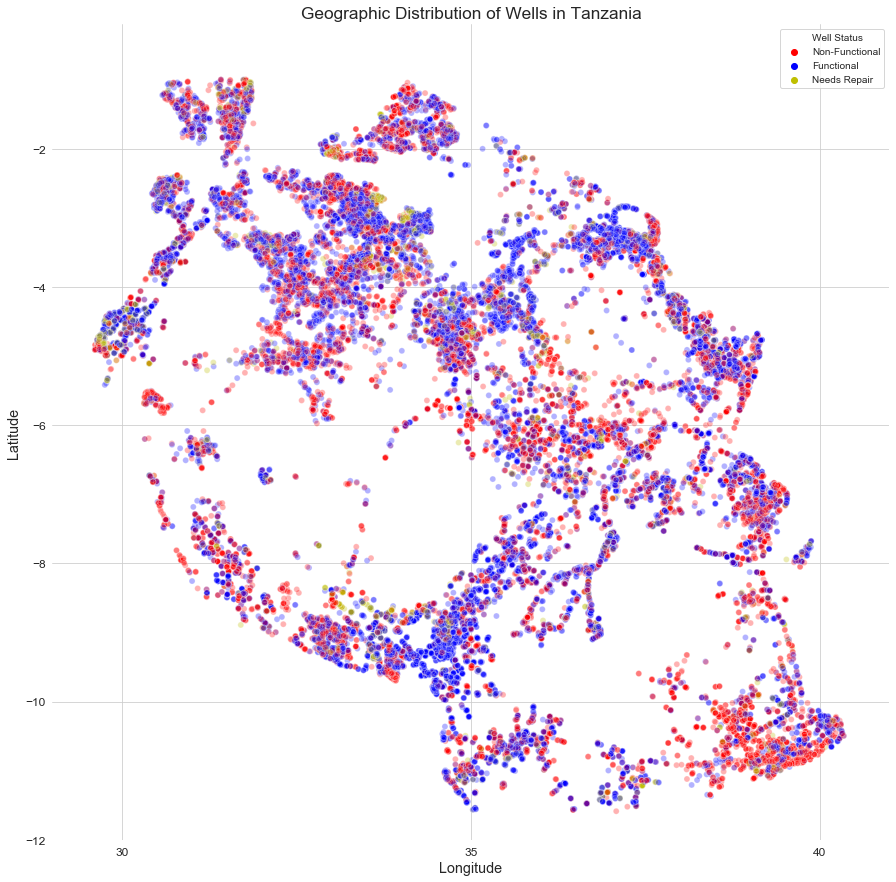

In [2]:
df['Well Status'] = df['status_group'].map(lambda x: 'Functional' if x == 'functional' 
                                                                  else 'Non-Functional' if x == 'non functional' 
                                                                  else 'Needs Repair')
fig = plt.figure(figsize=(15, 15))
sns.set_style('whitegrid')
graph_palette = {'Non-Functional':'r', 'Functional':'b', 'Needs Repair':"y"}
geo_status_chart = sns.scatterplot(data=df, x='longitude', y='latitude', hue='Well Status', alpha=0.5, palette=graph_palette)
sns.despine(left=True, bottom=True)
plt.title('Geographic Distribution of Wells in Tanzania', size='xx-large')
plt.xlabel('Longitude', size='x-large')
plt.ylabel('Latitude', size='x-large')
plt.yticks(ticks=geo_status_chart.get_yticks(), size='large')
plt.xticks(ticks=geo_status_chart.get_xticks(), size='large')
plt.ylim(bottom=-12, top=-0.2)
plt.xlim(left=29, right=41)
plt.show()

From this chart it can be seen that there is no direct geographical line that we could draw to separate functional from non-functional wells. Nonetheless, the wells do seem to form clusters, and there seem to more non-functional wells in the south-eastern section of the country.

Based on this, we recommend prioritizing aid to the regions of Lindi and Mtwara in the South, together with Dodoma, Tabora, and Rukwa in the center of the country and Mwara in the North.

In [ ]:
## Does the kind of waterpoint

## Other Observations about the data

- We have identified about about 2000 wells that can provide enough high-quality water, but are listed as 'functional in need of repair.' These should be our top priorities, especially those located in otherwise water-starved regions.

- In addition to these, there are a number of wells which have enough water, but are not functioning at this time. These would be ideal wells to try and repair so that they could become functional. Failing that, we should dig wells near those sites since the water is available there.